# Building an MLP Language Model
---

This is an extended version of Andrej Karpathy's notebook in addition to his [Zero To Hero](https://karpathy.ai/zero-to-hero.html) video on MLP language models.

Adapted by: 

Prof. Dr.-Ing. Antje Muntzinger, University of Applied Sciences Stuttgart

antje.muntzinger@hft-stuttgart.de

---


**NOTE:** You may answer in English or German.


# Table of Contents

[1. Text Generation with Multi-Layer-Perceptrons](#1.-Text-Generation-with-Multi-Layer-Perceptrons)

[2. Building the Dataset](#2.-Building-the-Dataset)

[3. Implementing the Neural Net](#3.-Implementing-the-Neural-Net)

[4. Training the MLP](#4.-Training-the-MLP)

[5. Training on Mini-Batches](#5.-Training-on-Mini-Batches)

[6. Tuning the Learning Rate](#6.-Tuning-the-Learning-Rate)

[7. Train-Valid-Test-Split](#7.-Train-Valid-Test-Split)

[8. Experiment: Larger Hidden Layer](#8.-Experiment:-Larger-Hidden-Layer)

[9. Visualization of the Embedding](#9.-Visualization-of-the-Embedding)

[10. Increasing the Embedding Dimension](#10.-Increasing-the-Embedding-Dimension)

[11. Final Evaluation and Sampling from the Model](#11.-Final-Evaluation-and-Sampling-from-the-Model)

[12. Challenge](#12.-Challenge)


## 1. Text Generation with Multi-Layer-Perceptrons

In the last notebook, we implemented a bigram language model in two versions: by counting the occurences of bigrams as well as by building a simple neural net with just a single layer. The problem with this approach is that if we are to take more context into account when predicting the next character in a sequence, things quickly blow up. For example, we had a 27x27 lookup table to predict the next token from the previous one. If we want to take the last 2 characters to predict the next, we already have a 27x27x27 lookup table, so the number of possible combinations grows exponentially with the length of the context. Therefore, we will explore a different approach here and implement a **Multi-Layer Perceptron (MLP)** following the 2003 paper
[A Neural Probabilistic Language Model](https://www.jmlr.org/papers/volume3/bengio03a/bengio03a.pdf) by Bengio et al. This was not the first paper applying an MLP to generate text, but it was very influential and is a nice write-up. In the paper, they used a word level language model with a vocabulary of 17 000 possible words. We will still use a character level language model, but follow the paper other than that. 

The idea of the paper is the following: To each word, a thirty dimensional feature vector is associated, so every word gets **embedded** into a thirty dimensional space. So we have 17 000 points or vectors in a 30 dimensional space (that's very crowded!) Now in the beginning these words are initialized randomly so they're spread out at random, but then we're going to tune these embeddings of the words using backpropagation. So during the training of this neural network, these vectors are going to move around and words that have  similar meanings or that are synonyms end up in a similar part of the space. Conversely, words with different meaning would go somewhere else in the space. Their modeling approach otherwise is identical to ours: They are using a multi-layer neural network to predict the next word given the previous words, and for training they are maximizing the log likelihood of the training data.

Why does this work? Suppose we want to complete the sentence 

    'A dog was running in a ...', 
    
which has never occured in the training data, so we are **out of distribution**.  But maybe the network has seen the sentence

    'The dog was running in a ...', 

and it has learned that 'a' and 'the' are frequently interchangeable, so it took the embeddings for 'a' and 'the' and put them nearby each other in the space. This is how the net can transfer knowledge through that embedding and generalize. Similarly, the network could know that cats and dogs are animals and they co-occur in lots of very similar contexts, and so even though you haven't seen this exact phrase, it can through the embedding space transfer knowledge and generalize to novel scenarios. Here is a nice visualization of embeddings (source: causewriter.ai):


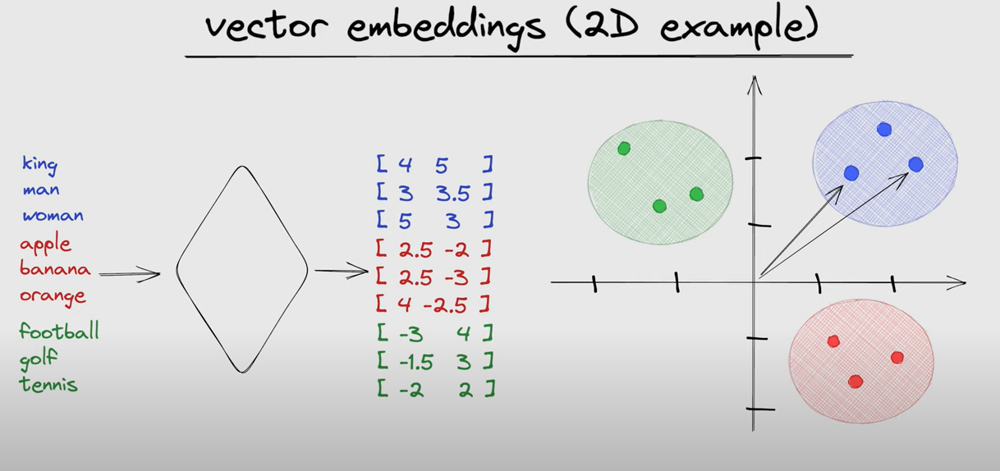

In [1]:
from IPython.display import Image
Image("embeddings.png", width="500")


Now let's take a closer look at the MLP:

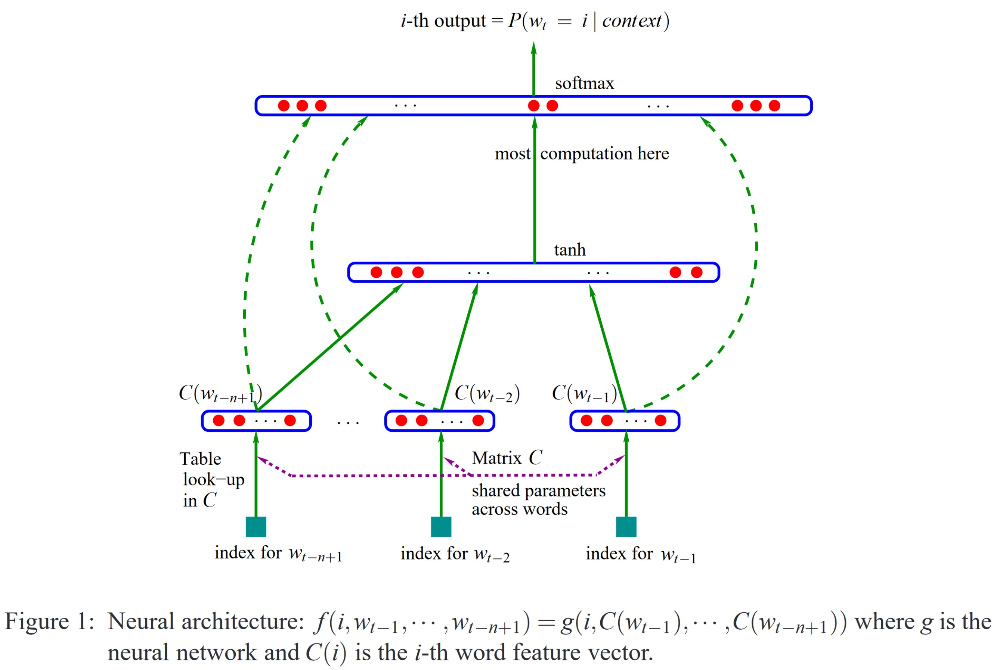

In [2]:
from IPython.display import Image
Image("MLP.jpg", width="600")

- *Input Layer:* Here, we are taking 3 previous words to predict the next word. The input is the index of the word, an integer between 0 and 16999 for 17 000 words. They use a lookup table C, a 17000x30 matrix, where every index is plucking out a row of this embedding matrix, so each index is converted to the 30 dimensional embedding vector for that word. The input layer consists of 30 neurons for three words making up 90 neurons in total. The matrix C is shared across all the words, so we're always indexing into the same matrix C over and over for each one of these words. 

- *Hidden Layer:* Then the data is processed to a hidden layer, where the size is a **hyperparameter** (a design choice up to the designer of the neural net), followed by a tanh nonlinearity. 

- *Output Layer:* Finally, the output layer consists of 17 000 neurons for all possible next words. So there are 17 000 logits followed by a softmax layer to calculate a probability distribution for the next word in the sequence. 

During training we have the label (=identity of the next word in a sequence), so we can pluck out the probability of that word and maximize the probability of that word with respect to the parameters of the neural net. The parameters that are optimized via backpropagation are the weights and biases of the output layer, the weights and biases of the hidden layer and the embedding lookup table C.

Now let's implement this network!

## 2. Building the Dataset

In [634]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt # for making figures
%matplotlib inline

In [1]:
# read in all the words
words = open('text_input/names.txt', 'r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [636]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


We introduce the **block size** (or **context length**) parameter telling us how many characters we use to predict the next, here 3. We store the **context** (=3 consecutive characters) in X and the labels (=the next character) in Y:

In [637]:
# build the dataset

block_size = 3 # context length: how many characters do we take to predict the next one?

def build_dataset(words):
    X, Y = [], []
    for w in words:
    
        print(w)
        context = [0] * block_size # [0, 0, 0] (pad with zeros='.')
        for ch in w + '.':
            ix = stoi[ch]
            X.append(context) # input
            Y.append(ix) # labels
            print(''.join(itos[i] for i in context), '--->', itos[ix]) # 'emma' contains 5 training examples
            context = context[1:] + [ix] # crop and append (rolling window of context) e.g. [0, 0, 5], then [0, 5, 13]..
    
    X = torch.tensor(X)
    Y = torch.tensor(Y)
    print(X.shape, Y.shape)
    return X, Y


X, Y = build_dataset(words[:5]) # let's just work on a small dataset of 5 names for now

emma
... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
olivia
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
ava
... ---> a
..a ---> v
.av ---> a
ava ---> .
isabella
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
sophia
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .
torch.Size([32, 3]) torch.Size([32])


In [638]:
X.shape, X.dtype, Y.shape, Y.dtype # we generated 32 training examples out of the 5 first words, each has 3 characters

(torch.Size([32, 3]), torch.int64, torch.Size([32]), torch.int64)

## 3. Implementing the Neural Net

Now let's build the *embedding table C*. In the paper, they have 17 000 words and they embed them in a comparably small 30 dimensional space. In our case, we have only 27 possible characters, so let's embed them in a comparably small space - let's start with a two-dimensional space:

In [639]:
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)

We visualize the 2D embeddings of all characters (which are untrained yet, just randomly initialized). Remember that they start anywhere in embedding space and move around during training, clustering in some meaningful way.

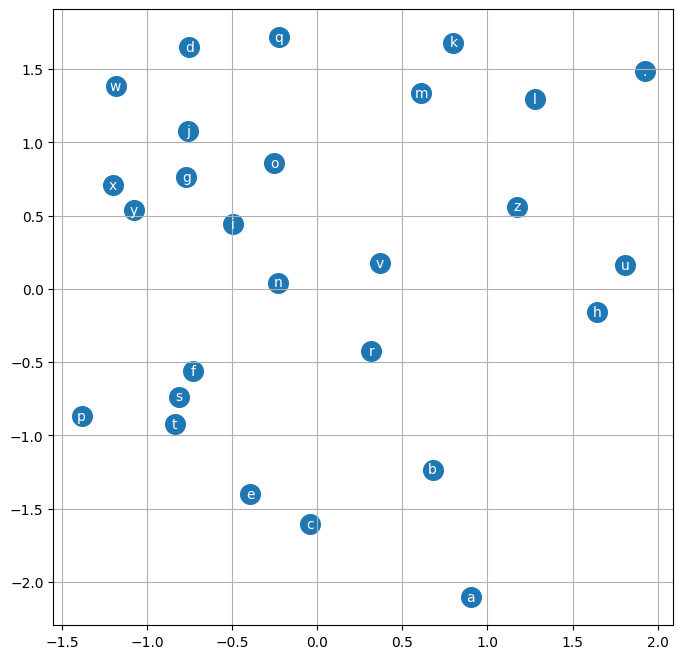

In [640]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')

There are two methods to pluck out the 5th row:

Option 1 - Directly plucking the embeddings from C:

In [641]:
C[5]

tensor([-0.3925, -1.4036])

Option 2 - Calculating the one-hot encoding of 5 and multiplying it with the embedding matrix:

In [642]:
F.one_hot(torch.tensor([5]), num_classes=27)

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0]])

In [643]:
F.one_hot(torch.tensor([5]), num_classes=27).float() @ C # note that we need to convert the one-hot to float from int to match the type of C

tensor([[-0.3925, -1.4036]])

Therefore, we can either think of the embedding as an integer indexing into a lookup table C, or as a first layer of the neural net with weight matrix C (without nonlinearity), where we encode integers into one-hot vectors and feed them in. Here, we are going to use the first interpretation with indexing because it is faster. But how can we simultaneously index all 32x3 integers stored in X? Luckily, we can also index with a list or tensor in PyTorch:

In [644]:
C[[4,4,5]], C[torch.tensor([4,4,5])] # indexing with a list or tensor of indices

(tensor([[-0.7521,  1.6487],
         [-0.7521,  1.6487],
         [-0.3925, -1.4036]]),
 tensor([[-0.7521,  1.6487],
         [-0.7521,  1.6487],
         [-0.3925, -1.4036]]))

In [645]:
X[13,2], C[X][13,2], C[1] # another example for indexing

(tensor(1), tensor([ 0.9007, -2.1055]), tensor([ 0.9007, -2.1055]))

In [646]:
emb = C[X] # we can even directly use the tensor X to index into C
emb.shape # shape of the embeddings - we need to flatten them for the hidden layer

torch.Size([32, 3, 2])

**TODO (optional):** Why is the shape of the embedding 32x3x2?

**ANSWER:** The embedding matrix C is of shape 27x2 (we have 27 characters and use a small 2-dimensional embedding). We pluck out the corresponding row in C for every input in X. The input X is of shape 32x3 (we created 32 examples out of the first 5 names, each consisting of 3 characters, our context length). Therefore, we pluck out 32x3 rows of length 2, totalling in an embedding shape of 32x3x2.

Here is a visualization of our embedding of input '.em' (actually 3 embeddings, each token plucks out the corresponding row of C independently):


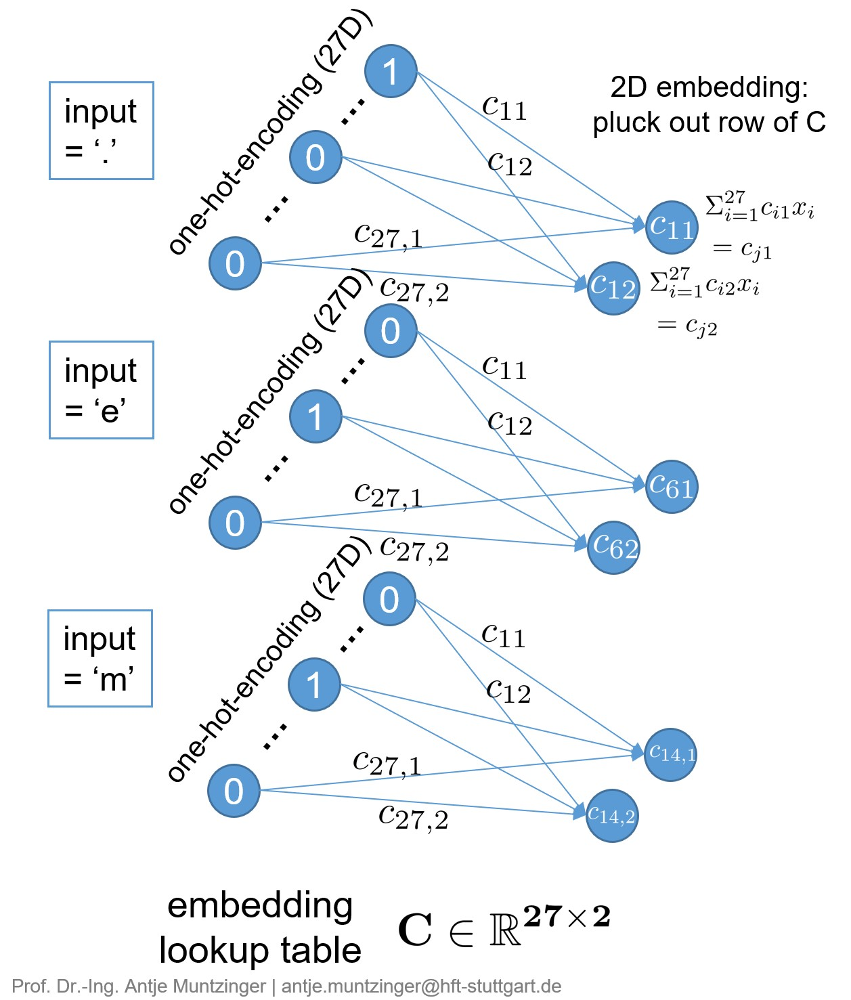

In [3]:
from IPython.display import Image
Image("MLP1.jpg", width="400")

Now let's implement the *hidden layer* of size 100 (a design choice). We start by initializing weights and biases:

In [647]:
W1 = torch.randn((6, 100)) # 6 = block_size * emb_dim = 3 * 2, 100 = hidden size (design choice)
b1 = torch.randn(100) # bias for the hidden layer

We calculate the weighted sum (**logits**) and apply the **tanh() activation**: 

In [648]:
logits = emb.view(-1, 6) @ W1 + b1 # reshaping the embeddings to (batch_size, block_size * emb_dim) and applying the linear layer

In [649]:
h = torch.tanh(logits) # apply tanh activation

In [650]:
h

tensor([[ 0.9981,  0.9960,  0.9998,  ...,  1.0000,  0.9695, -0.9999],
        [ 0.9165, -0.8189,  0.8739,  ...,  0.8896,  0.9535,  0.6013],
        [ 0.5769,  0.3406, -0.8217,  ...,  0.9963, -0.9992, -0.2433],
        ...,
        [-0.9480, -0.8069, -0.9973,  ...,  0.1905, -0.9935,  0.3350],
        [-0.9956, -0.8950,  0.9868,  ...,  0.9946, -0.4663,  0.9810],
        [ 0.9988, -0.9581, -0.9920,  ..., -0.9886,  0.4861,  0.9934]])

In [651]:
h.shape

torch.Size([32, 100])

Here is a visualization of our hidden layer after flattening the embedding:

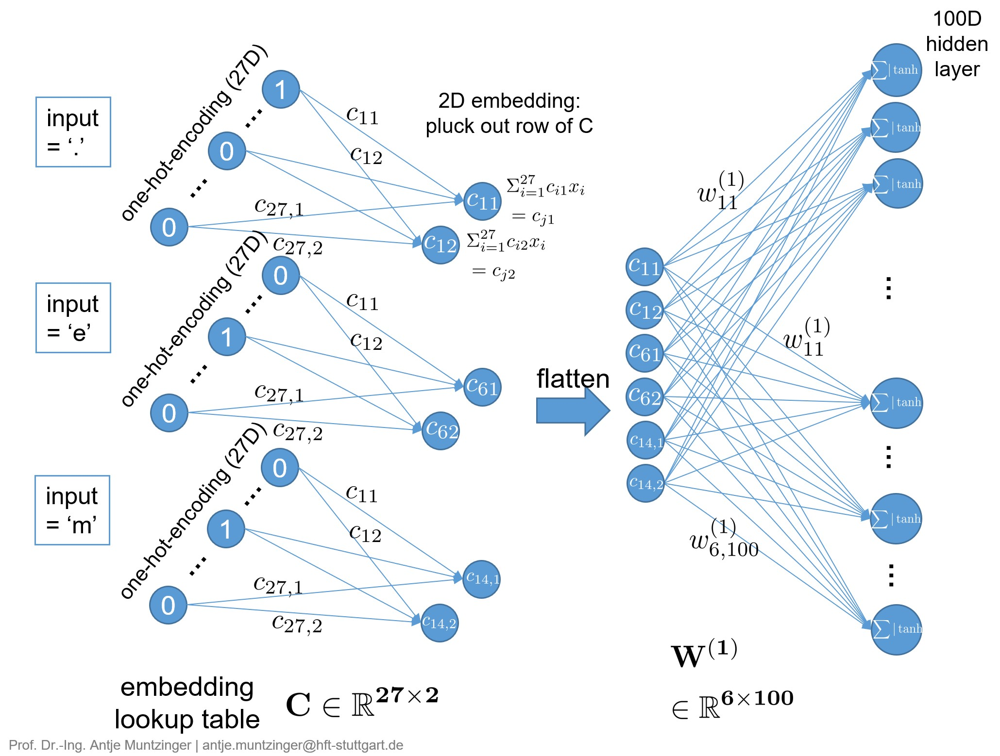

In [4]:
from IPython.display import Image
Image("MLP2.jpg", width="700")

And the *output layer*:

In [652]:
W2 = torch.randn((100, 27)) # 100 = hidden size, 27 = vocab size
b2 = torch.randn(27)

**TODO:** 3a) Calculate the logits (weighted sum) with input `h`, weights `W2` and bias `b2`. Store the result in `logits`. What is the shape of the output and why? **(3 points)**

In [653]:
# YOUR CODE GOES HERE
logits = h @ W2 + b2 # linear layer
logits.shape

torch.Size([32, 27])

**ANSWER:** The logits are of shape 32x27 because we are processing 32 examples at once that we created out of the 5 first words (our **batch size**), and the output shape is 27 for 27 possible next characters (our **vocabulary length**).

**TODO:** 3b) Calculate the counts by exponentating the logits and store the result in `counts`, then normalize to get probabilities and store the result in `prob`. **(2 points)** 

**HINT:** Remember the bigram model!

In [654]:
# YOUR CODE GOES HERE
counts = logits.exp() # exponentiate to get the unnormalized probabilities
prob = counts / counts.sum(1, keepdims=True) # normalize to get the probabilities
prob.shape

torch.Size([32, 27])

This is a visualization of our complete MLP:

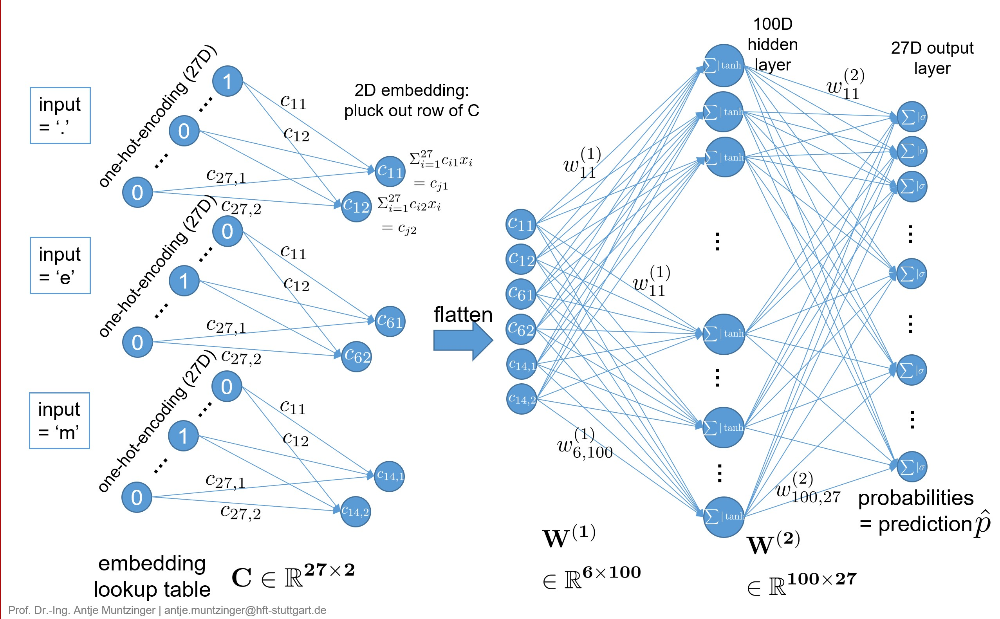

In [5]:
from IPython.display import Image
Image("MLP3.jpg", width="800")

Finally we calculate the cross entropy loss:

In [655]:
loss = -prob[torch.arange(len(Y)), Y].log().mean() # cross-entropy loss
loss

tensor(22.8721)

## 4. Training the MLP

Let's summarize the code so far and train the network! We summarize all trainable parameters in a list called `parameters`:

In [656]:
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

In [657]:
sum(p.nelement() for p in parameters) # number of parameters in total

3481

In [658]:
for p in parameters:
    p.requires_grad = True 

**TODO:** 4a) Research why we need to set `requires_grad = True`, e.g. in the PyTorch documentation! **(1 point)** 

**ANSWER:** We want to optimize the parameters with backpropagation / gradient descent, so we need to store all gradients for applying chain rule.

**TODO:** 4b) In the code block below, try to understand what each line of code does, and comment each line! **(3 points)**

In [ ]:
# YOUR COMMENTS GO HERE

niter = 1000 # number of iterations

for i in range(niter): # loop over 1000 iterations

    # forward pass
    emb = C[X] # calculate embedding of shape (32, 3, 10)
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # calculate hidden layer output of shape (32, 200)
    logits = h @ W2 + b2 # calculate logits of shape (32, 27)
    loss = F.cross_entropy(logits, Y) # use PyTorch CE loss instead of the manual computation above (more efficient and numerically stable)
    
    # backward pass
    for p in parameters: # loop over all parameters
        p.grad = None # reset the gradient
    loss.backward() # compute the gradient
    
    # update
    for p in parameters: # loop over all parameters
        p.data += -0.1 * p.grad # gradient descent with learning rate 0.1

    print(loss.item()) # print the loss

17.775842666625977
14.432574272155762
12.249408721923828
10.55549430847168
9.166698455810547
8.059216499328613
7.099236488342285
6.237092971801758
5.497320652008057
4.880398750305176
4.3454132080078125
3.874847650527954
3.4561681747436523
3.0790395736694336
2.730928897857666
2.4046101570129395
2.101841688156128
1.8323791027069092
1.6064164638519287
1.4234559535980225
1.2727105617523193
1.1428966522216797
1.0295873880386353
0.9257121086120605
0.8360241055488586
0.753555178642273
0.683792769908905
0.620478630065918
0.5672280788421631
0.523193359375
0.4890210032463074
0.46197330951690674
0.44014158844947815
0.4220907688140869
0.40706971287727356
0.3944872319698334
0.3838937282562256
0.3749019503593445
0.3671998381614685
0.36053550243377686
0.35471197962760925
0.34957510232925415
0.3450056314468384
0.3409090042114258
0.337211012840271
0.33385246992111206
0.3307854235172272
0.3279708921909332
0.32537660002708435
0.3229760229587555
0.32074663043022156
0.3186696171760559
0.3167286813259125
0.

**TODO:** 4c) Can you interpret the loss - why is it so small? **(2 points)**

**HINT:** Is a small training loss always a good sign, or should we consider other factors as well?

**ANSWER:** Overfitting! We only use 32 examples of the first five words and we have 3400 parameters, so a quite powerful neural net for which it is easy to perfectly fit these few examples. Therefore, we are overfitting a single batch of the data and getting a very low loss and good predictions. However, the net will not generalize well to unseen examples due to overfitting.

**TODO:** 4d) Can we reach a loss of exactly 0 when continuing optimization? Why or why not? **(2 points)**

**ANSWER:** The loss can never be exactly 0 because for the exact same input, there are different possible outputs in the training set. For example above, we saw that '...' can be followed by 'e', 'o' or 'a'. But in case there is a unique output for a unique input, we get the exact same result when overfitting.

Summing all steps in a visualization, including cross entropy loss calculation:

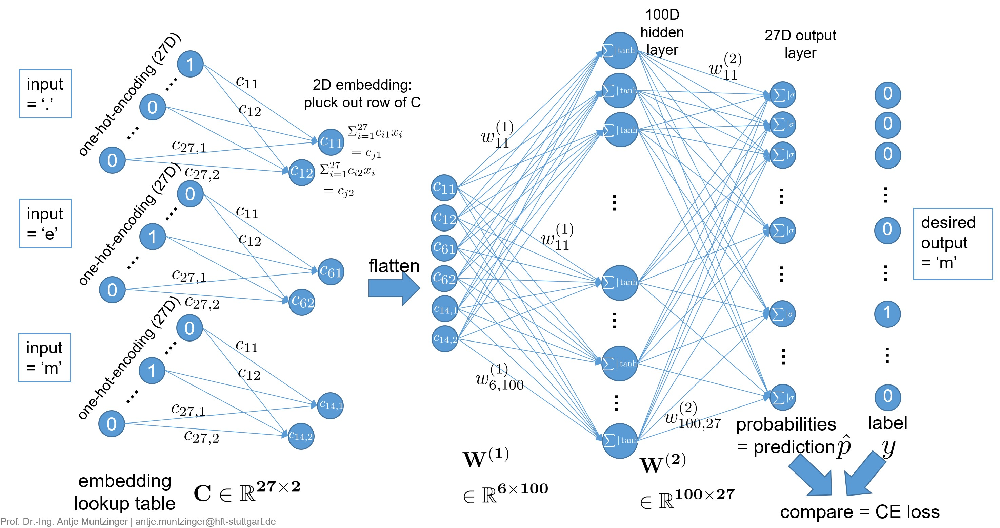

In [6]:
from IPython.display import Image
Image("MLP4.jpg", width="900")

---

## 5. Training on Mini-Batches

**TODO:** 5a) Read in the whole dataset for training instead of the first 5 words and store the inputs and labels in X and Y again! How many training examples do we have now roughly? **(2 points)** 

**HINT:** Use the `build_dataset()` function defined above!

In [660]:
# YOUR CODE GOES HERE
# we build the dataset for all the words (instead of just the first 5)
X, Y = build_dataset(words)

X.shape, X.dtype, Y.shape, Y.dtype # now we have roughly 200 000 training examples

emma
... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
olivia
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
ava
... ---> a
..a ---> v
.av ---> a
ava ---> .
isabella
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
sophia
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .
charlotte
... ---> c
..c ---> h
.ch ---> a
cha ---> r
har ---> l
arl ---> o
rlo ---> t
lot ---> t
ott ---> e
tte ---> .
mia
... ---> m
..m ---> i
.mi ---> a
mia ---> .
amelia
... ---> a
..a ---> m
.am ---> e
ame ---> l
mel ---> i
eli ---> a
lia ---> .
harper
... ---> h
..h ---> a
.ha ---> r
har ---> p
arp ---> e
rpe ---> r
per ---> .
evelyn
... ---> e
..e ---> v
.ev ---> e
eve ---> l
vel ---> y
ely ---> n
lyn ---> .
abigail
... ---> a
..a ---> b
.ab ---> i
abi ---> g
big ---> a
iga ---> i
gai ---> l
ail ---> .
emily
... ---> e
..e ---> m
.em ---> i
emi ---> l
mil ---> y
ily ---> .
elizabeth
... ---> e
..e ---

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

**ANSWER:** We now have roughly 200 000 training examples.

In practice, it is too computationally expensive to forward and backward pass the whole training set at once. Instead, we use **mini-batches** of e.g. 32 randomly chosen examples processed in parallel. The quality of the gradient might be a little lower because we are not using all data, the direction of the gradient is not the exact actual direction, but it is good enough and we can simply calculate more steps to compensate this.   

We can use `randint` for random sampling of the batch examples. Like this, we sample 32 random row indices of X (wicht is now of shape 228146 x 3):

In [661]:
torch.randint(0, X.shape[0], (32,)) # example of sampling from a uniform distribution (low, high, shape)

tensor([ 87423,  48286,  53355, 180661,  38312,  20586, 195953,  35698, 164239,
         96295,  69229, 147069,  93420, 205437, 149385,  61906,  78429, 152119,
         76767,  68422,  12262,  55607, 142331, 118317, 189780, 218647,  89930,
        125524, 103904,  59162, 193702, 101688])

This is the training loop with random mini-batches of size 32:

In [662]:
niter = 1000 # number of iterations

for i in range(niter):
    
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X[ix]] # (32, 3, 10)
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 200)
    logits = h @ W2 + b2 # (32, 27)
    loss = F.cross_entropy(logits, Y[ix]) # instead of the manual computation above (more efficient and numerically stable)
    print(loss.item())
    
    # backward pass
    for p in parameters:
        p.grad = None # reset the gradients
    loss.backward() # compute the gradients
    
    # update
    for p in parameters:
        p.data += -0.1 * p.grad

12.366443634033203
13.36948013305664
14.156403541564941
13.220441818237305
10.500885009765625
11.818502426147461
10.316924095153809
10.20863151550293
8.875706672668457
5.51765775680542
8.785016059875488
6.648197174072266
10.478311538696289
9.112065315246582
8.60844612121582
7.577598571777344
7.691463470458984
6.995861530303955
5.630987167358398
9.066180229187012
8.034239768981934
6.738372802734375
8.022730827331543
5.922538757324219
5.303854465484619
6.897715091705322
6.463837623596191
5.083693981170654
5.214895725250244
5.514703750610352
6.575749397277832
7.782522678375244
6.461495876312256
6.579684734344482
5.2986555099487305
5.977921485900879
4.6669230461120605
5.207545757293701
5.740358829498291
7.193731784820557
5.282850742340088
5.042940139770508
5.810603618621826
4.2953104972839355
4.926269054412842
7.19443416595459
6.142048358917236
3.7102553844451904
4.526669025421143
5.9092206954956055
4.101527690887451
3.737013339996338
5.026381015777588
3.6709187030792236
5.362617492675781


## 6. Tuning the Learning Rate

The code blocks below summarize the code so far. For repeated execution, we write a function `trainloop()` that can be called with different numbers of iterations, learning rates etc:

In [663]:
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters
    

In [664]:
# define the training loop as a function
def trainloop(niter, X, Y, parameters, lrs, output=True, emb_dim=2, context_length=3):  

    # keep track of the losses and steps
    lossi = []  
    stepi = []
    
    for i in range(niter):
        
        # minibatch construct
        ix = torch.randint(0, X.shape[0], (32,))
        
        # forward pass
        emb = C[X[ix]] # (32, 3, 10)
        h = torch.tanh(emb.view(-1, emb_dim*context_length) @ W1 + b1) # (32, 200)
        logits = h @ W2 + b2 # (32, 27)
        loss = F.cross_entropy(logits, Y[ix]) # instead of the manual computation above (more efficient and numerically stable)
        if output:
            print(loss.item())
        
        # backward pass
        for p in parameters:
            p.grad = None # reset the gradients
        loss.backward() # compute the gradients
        
        # update
        lr = lrs[i]
        for p in parameters:
            p.data += -lr * p.grad

        # track stats
        stepi.append(i)
        lossi.append(loss.log10().item())

    return parameters, stepi, lossi

In [665]:
# define the hyperparameters and run the training loop
niter = 1000 # number of iterations

lrs = torch.full((niter,), 0.1) # learning rates = tensor of constant values (0.1) for all iterations

parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs) # run the training loop

17.940656661987305
13.128927230834961
12.914198875427246
12.515254020690918
10.889880180358887
14.106998443603516
11.533710479736328
11.413723945617676
10.897685050964355
7.155044078826904
8.836350440979004
10.726480484008789
10.451130867004395
10.769461631774902
8.624706268310547
9.047303199768066
6.776983261108398
7.668196678161621
7.705835342407227
7.598458766937256
8.703252792358398
6.09985876083374
7.513954162597656
6.808840274810791
6.593862533569336
6.512269496917725
9.107015609741211
8.530131340026855
8.878012657165527
6.945959091186523
5.240839958190918
4.871886253356934
5.857754707336426
8.896842002868652
7.418169975280762
7.8751678466796875
6.457504749298096


6.181328296661377
5.762017250061035
6.092679023742676
6.074067115783691
6.471075057983398
6.760850429534912
6.150787353515625
7.1454386711120605
5.616178512573242
4.881041526794434
4.524771213531494
5.419389724731445
5.714727878570557
5.955143928527832
6.6791300773620605
7.2765889167785645
6.085534572601318
6.881099700927734
3.8404431343078613
5.6348395347595215
4.347978591918945
5.137608528137207
5.431912899017334
5.717075347900391
4.7060041427612305
5.150321960449219
4.328772068023682
4.770448207855225
4.214768886566162
5.152092933654785
3.453247308731079
5.197212219238281
3.616323947906494
4.783890724182129
4.599839687347412
5.5626115798950195
5.144045829772949
4.122497081756592
4.385095596313477
5.426552772521973
4.050869941711426
3.6803364753723145
3.715197801589966
3.9796674251556396
4.630043983459473
2.9851267337799072
4.959813117980957
4.619826316833496
4.494970321655273
4.704929351806641
5.121248245239258
4.2658514976501465
3.309074640274048
4.478785991668701
4.749826431274414

**TODO:** 6a) Experiment with different learning rates. Don't forget to reset the parameters first! Which learning rate seems to work best? Which learning rates are too high or too low? **(3 points)**

In [666]:
# YOUR EXPERIMENTS HERE

# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# This learning rate is too big: the loss explodes
lrs = torch.full((niter,), 10) # constant learning rate
parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs) # run the training loop

16.608732223510742
34.10584259033203
29.847219467163086
37.011268615722656
45.874568939208984
48.177574157714844
57.12289810180664
51.60918045043945
48.26516342163086
47.39952850341797
60.13261795043945
75.51203155517578
58.3717155456543
47.6658821105957
85.8332290649414
66.08663177490234
92.04290771484375
106.36225128173828
67.12017059326172
95.2238540649414
107.8762435913086
146.0914764404297
91.98719787597656
117.15413665771484
74.82769775390625
95.66545104980469
73.6740951538086
148.93380737304688
104.34900665283203
124.50390625
114.43182373046875
129.6827850341797
148.76075744628906
111.1028060913086
103.45646667480469
102.50169372558594
129.78372192382812
127.99282836914062
132.17578125
122.57299041748047
103.7173843383789
88.27591705322266
62.14329528808594
73.19300079345703
62.91510772705078
69.82526397705078
72.47630310058594
65.71693420410156
52.792755126953125
70.25491333007812
68.744384765625
71.60646057128906
59.01897048950195
53.46395492553711
53.53456115722656
61.5341758

In [667]:
# YOUR EXPERIMENTS HERE

# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# This learning rate is too small: the loss converges very slowly
lrs = torch.full((niter,), 0.0001) # constant learning rate
parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs) # run the training loop

15.788446426391602
15.398188591003418
14.65185546875
15.95810604095459
18.77655029296875
17.625080108642578
16.592315673828125
17.44563865661621
20.351337432861328
17.525108337402344
14.720929145812988
20.60810661315918
16.122116088867188
16.630830764770508
17.41152572631836
17.259231567382812
14.294427871704102
15.079044342041016
15.207969665527344
16.931364059448242
14.858315467834473
19.046932220458984
18.73857307434082
15.408699989318848
20.40119171142578
17.5465030670166
17.26898193359375
15.423238754272461
14.854169845581055
14.785229682922363
17.886024475097656
15.152791976928711
18.341724395751953
17.727922439575195
14.434918403625488
15.831411361694336
13.735772132873535
17.190719604492188
16.66529655456543
16.07082748413086
15.322598457336426
15.600326538085938
14.759515762329102
16.190107345581055
17.5463924407959
16.248491287231445
15.442117691040039
15.359695434570312
16.376951217651367
16.243350982666016
19.45781135559082
16.1031494140625
14.420490264892578
16.47662925720

In [668]:
# YOUR EXPERIMENTS HERE

# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# This learning rate is ok: the loss converges
lrs = torch.full((niter,), 0.1) # constant learning rate
parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs) # run the training loop

16.173845291137695
16.996238708496094
12.491857528686523
14.315135955810547
12.24077320098877
14.144170761108398
12.925135612487793
11.4078950881958
10.119244575500488
9.589662551879883
8.744976043701172
8.811882972717285
9.153932571411133
9.859766006469727
10.114690780639648
9.166213989257812
7.261411190032959
8.16748046875
7.951689720153809
7.384678363800049
7.359821796417236
7.698897361755371
6.837600231170654
8.09449291229248
6.514220237731934
6.249742031097412
8.462658882141113
6.976376056671143
6.087178707122803
6.728169918060303
8.945466995239258
5.377995491027832
8.208968162536621
7.3272857666015625
6.494626998901367
6.865809917449951
6.165023326873779
6.308921813964844
6.062839031219482
6.478446960449219
5.675771236419678
5.239959716796875
5.320357322692871
8.139927864074707
6.628126621246338
6.187614440917969
6.034099578857422
5.23339319229126
4.618515491485596
5.571901321411133
4.879642486572266
3.847195625305176
5.33729887008667
4.671338081359863
6.667773723602295
6.1229467

**ANSWER:** `lr=10` is too big (divergence), `lr=0.0001` is too small (no improvement), the best learning rate is probably between 0.001 and 1.

We can make the search more systematic using **grid search** techniques:

In [669]:
# systematically test different learning rates (logarithmically spaced between 1e-3 and 1)
lre = torch.linspace(-3, 0, 1000) # lre = learning rate exponent = log10(learning rate)
lrs = 10**lre

In [670]:
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list

for p in parameters:
    p.requires_grad = True # we want to learn the parameters
    

parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs) # run the training loop

14.794132232666016
18.66649627685547
18.134416580200195
15.216541290283203
16.58188819885254
18.14527702331543
17.577980041503906
14.79487133026123
13.77027702331543
16.964509963989258
18.480798721313477
15.004725456237793
16.07705307006836
14.64083480834961
18.64914894104004
16.430431365966797
18.429271697998047
13.230042457580566
18.61457633972168
12.626639366149902
15.370715141296387
13.950580596923828
14.935035705566406
19.166791915893555
16.106721878051758
17.045459747314453
19.052053451538086
17.346281051635742
16.07293701171875
16.476974487304688
16.56744384765625
16.63758087158203
14.934126853942871
14.427979469299316
15.52655029296875
16.28449821472168
18.26909065246582
16.72297477722168
16.026105880737305
17.550060272216797
14.383307456970215
15.35923957824707
17.996597290039062
13.083006858825684
14.635422706604004
14.409663200378418
15.566825866699219
14.232769012451172
15.33297348022461
17.764793395996094
17.70477867126465
15.876229286193848
18.332731246948242
15.385660171

**TODO:** 6b) Plot the loss over the different learning rate exponents. Which learning rate should we use? **(2 points)**

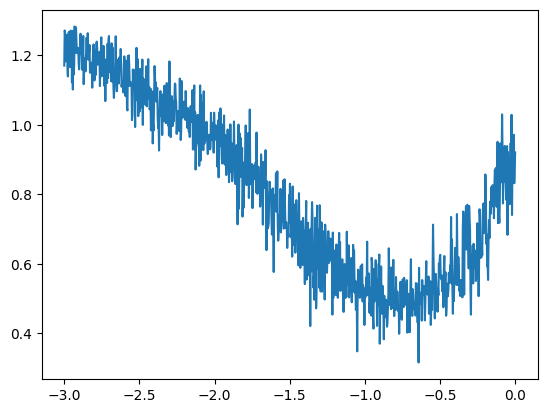

In [671]:
# YOUR CODE GOES HERE
plt.plot(lre, lossi) # plot the loss over steps

**ANSWER:** Somewhere around exponent -1, the loss is minimal, so we can use a learning rate of 1e-1=0.1.

Now that we have found a good learning rate, let's only do one step of **learning rate decay** and run for a very long time. This is how you would roughly proceed in production as well: Find a good learning rate via grid search, train with it until the loss reaches a plateau, then decrease the learning rate some more and see if the loss goes down again. 

In [672]:
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

In [673]:
niter = 100000 # number of iterations

lrs = torch.full((niter,), 0.1) # learning rates = tensor of constant values (0.1) for the first 50 000 iterations
lrs[50000:] = 0.01 # learning rates = tensor of constant values (0.01) for the remaining 50 000 iterations

parameters, stepi, lossi = trainloop(niter, X, Y, parameters, lrs, output=False) # run the training loop

In [674]:
# evaluate loss
emb = C[X] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Y)
loss

tensor(2.2913, grad_fn=<NllLossBackward0>)

We see that the loss is at 2.29, which is already better than the bigram model from the last notebook, which was 2.45! 

...except that this is not exactly true: The loss on the training data could become very small only due to overfitting. The model could only memorize the training data and perform very good on these, but poorly once you test it with new data. Therefore, the data is usually split in 3 parts: The **training data** (e.g. 80%) is used for parameter optimization like we did above using gradient descent. The **validation data** or **dev data** (e.g. 10%) is used for tuning hyperparameters (e.g. size of the hidden layer, size of the embedding, learning rate...) and the **test data set** (e.g. 10%) is kept aside to measure the final performance and generalization capabilities of the model. The test set should only be used once because each time you evaluate on the test set and learn something from it, you basically train on the test set, so you also risk overfitting to your test set and will not be able to measure generalization capabilities anymore. So let's implement this:

## 7. Train-Valid-Test-Split

**TODO:** 7a) Split the data in 80% training data stored in `Xtr`, `Ytr`, 10% dev data stored in `Xdev`, `Ydev` and 10% test data stored in `Xte`, `Yte`. Don't forget to randomly shuffle the words first. **(3 points)**

**HINT:** You can use `random.shuffle` to shuffle the words. Then, create the data splits and call `build_dataset()` with the created subsets.

In [675]:
# YOUR CODE GOES HERE
# randomly shuffle the words
import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words)) # 80% train
n2 = int(0.9*len(words)) # 10% dev, 10% test

Xtr, Ytr = build_dataset(words[:n1]) # build the training set
Xdev, Ydev = build_dataset(words[n1:n2]) # build the dev set
Xte, Yte = build_dataset(words[n2:]) # build the test set

yuheng
... ---> y
..y ---> u
.yu ---> h
yuh ---> e
uhe ---> n
hen ---> g
eng ---> .
diondre
... ---> d
..d ---> i
.di ---> o
dio ---> n
ion ---> d
ond ---> r
ndr ---> e
dre ---> .
xavien
... ---> x
..x ---> a
.xa ---> v
xav ---> i
avi ---> e
vie ---> n
ien ---> .
jori
... ---> j
..j ---> o
.jo ---> r
jor ---> i
ori ---> .
juanluis
... ---> j
..j ---> u
.ju ---> a
jua ---> n
uan ---> l
anl ---> u
nlu ---> i
lui ---> s
uis ---> .
erandi
... ---> e
..e ---> r
.er ---> a
era ---> n
ran ---> d
and ---> i
ndi ---> .
phia
... ---> p
..p ---> h
.ph ---> i
phi ---> a
hia ---> .
samatha
... ---> s
..s ---> a
.sa ---> m
sam ---> a
ama ---> t
mat ---> h
ath ---> a
tha ---> .
phoenix
... ---> p
..p ---> h
.ph ---> o
pho ---> e
hoe ---> n
oen ---> i
eni ---> x
nix ---> .
emmelynn
... ---> e
..e ---> m
.em ---> m
emm ---> e
mme ---> l
mel ---> y
ely ---> n
lyn ---> n
ynn ---> .
hollan
... ---> h
..h ---> o
.ho ---> l
hol ---> l
oll ---> a
lla ---> n
lan ---> .
hollis
... ---> h
..h ---> o
.ho ---> l


**TODO**: 7b) Train the model on the training data only, then evaluate on the train data and the dev data for comparison. Don't forget to reset the parameters first! **(3 points)**

In [678]:
# YOUR CODE GOES HERE
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# run the training loop
parameters, stepi, lossi = trainloop(niter, Xtr, Ytr, parameters, lrs, output=False) 

# evaluate loss on training and dev sets
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
print('train loss:', loss)

emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
print('dev loss:', loss)

train loss: tensor(2.2981, grad_fn=<NllLossBackward0>)
dev loss: tensor(2.2983, grad_fn=<NllLossBackward0>)


**TODO:** 7c) How do you interpret the train versus dev loss? **(1 point)**

**ANSWER:** Train and dev loss are quite similar, we are not overfitting. In fact, this is a sign for **underfitting**: The model is too simple compared to the data. 

---

## 8. Experiment: Larger Hidden Layer

**TODO:** 8a) Experiment with a hidden layer of size 300 and train for a long time. Plot the loss over the steps (not the learning rate this time!). We are expecting to further decrease the training loss because we have a more powerful network now. Can we achieve this? **(3 points)**

In [679]:
# YOUR CODE GOES HERE
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 300), generator=g)
b1 = torch.randn(300, generator=g)
W2 = torch.randn((300, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# run the training loop
niter = 200000

lrs = torch.full((niter,), 0.1) # learning rates = tensor of constant values (0.1) for the first 100 000 iterations
lrs[100000:] = 0.01 # learning rates = tensor of constant values (0.01) for the remaining 100 000 iterations

parameters, stepi, lossi = trainloop(niter, Xtr, Ytr, parameters, lrs, output=False) 

In [680]:
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
print('train loss:', loss)

emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
print('dev loss:', loss)

train loss: tensor(2.2355, grad_fn=<NllLossBackward0>)
dev loss: tensor(2.2434, grad_fn=<NllLossBackward0>)


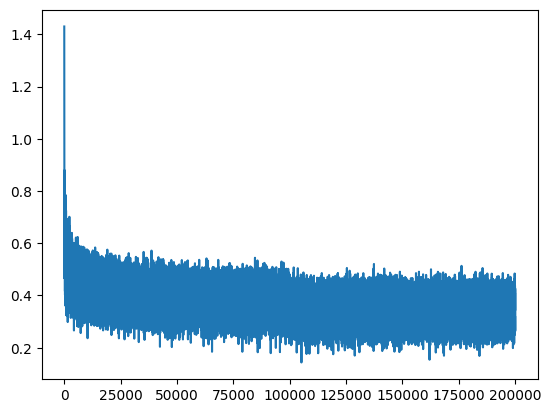

In [681]:
plt.plot(stepi, lossi) # plot the loss over steps

**ANSWER:** The train loss has further decreased a little, but not as much as we could have hoped for.

**TODO:** 8b) Why is the loss so noisy, not decreasing monotonically? **(1 point)**

**ANSWER:** This is due to the minibatches, which introduce some randomness. Increasing the batch size could help improving the result

## 9. Visualization of the Embedding

The training loss is not really decreasing with increased hidden layer. It could be that the bottleneck of the network right now are the embeddings that are twodimensional. Intuitively: We are cramming too many characters into just two dimensions and the neural net is not able to use that space effectively. Let's visualize the embeddings for a better understanding:

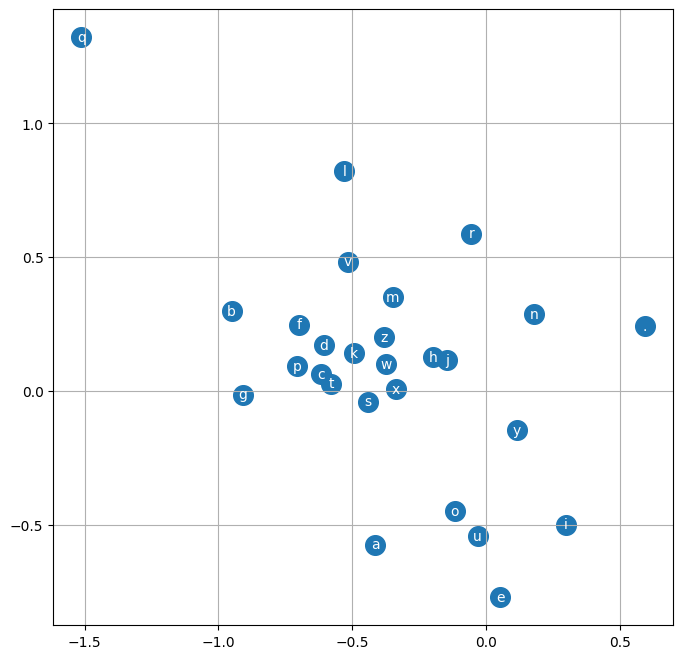

In [682]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')

**TODO:** 9) Can you interpret the embedding plot? Do you see some structure that the network has learned, or is it purely random - especially compared to our initial plot above? **(2 points)**

**ANSWER:** The vowels get clustered, so the network treats the vowels quite similar and learns that they are in a way interchangable, because their embeddings are similar. Also, there are some 'exceptional' characters like 'q' and '.' that are separate from the clustered rest. So the embedding is definitely not random and makes sense.

## 10. Increasing the Embedding Dimension

**TODO:** 10a) Change the dimension of the embedding to 10 and re-run the training loop. **(2 points)** 

**HINT:** Note that the embedding dimension can be passed as input into `train_loop()`!

In [683]:
# YOUR CODE GOES HERE
# reset the parameters
g = torch.Generator().manual_seed(42) # for reproducibility
C = torch.randn((27, 10), generator=g)
W1 = torch.randn((30, 200), generator=g)
b1 = torch.randn(200, generator=g)
W2 = torch.randn((200, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2] # cluster all parameters in one list for counting the number of parameters

for p in parameters:
    p.requires_grad = True # we want to learn the parameters

# run the training loop


parameters, stepi, lossi = trainloop(niter, Xtr, Ytr, parameters, lrs, output=False, emb_dim=10) 


In [684]:
# evaluate losses on training and dev sets
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
print('train loss:', loss)

emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
print('dev loss:', loss)

train loss: tensor(2.1224, grad_fn=<NllLossBackward0>)
dev loss: tensor(2.1599, grad_fn=<NllLossBackward0>)


Note that we are optimizing the model by hand here for educational purposes - in production, you would create hyperparameters and use grid search for a more systematic search.

**TODO:** 10b) How do you interpret train and dev losses now? **(1 point)**

**ANSWER:** The train loss gets a little bit lower than the dev loss, we are slowly starting to overfit. The loss decreased further, the embedding size increase has helped!

## 11. Final Evaluation and Sampling from the Model

Once we have found a set of promising hyperparameters, we evaluate on the test set *once* and get the final loss to report in a paper for example. Then we can generate new samples using the model:

In [685]:
# sample from the model
g = torch.Generator().manual_seed(42 + 10)

for _ in range(20):
    
    out = []
    context = [0] * block_size # initialize with all ... as context
    while True:
        emb = C[torch.tensor([context])] # (1,block_size,d)
        h = torch.tanh(emb.view(1, -1) @ W1 + b1)
        logits = h @ W2 + b2
        probs = F.softmax(logits, dim=1)
        ix = torch.multinomial(probs, num_samples=1, generator=g).item() # get next index by sampling
        context = context[1:] + [ix] # update context
        out.append(ix) # store the output
        if ix == 0:
            break
    
    print(''.join(itos[i] for i in out))

ellane.
fean.
elyn.
subella.
ble.
wav.
lovon.
lemitrey.
jaxek.
amazeyauki.
payle.
azei.
keng.
mar.
ana.
avuro.
kelline.
arohemmachi.
nate.
jahend.


We see that the output looks a lot more like names now, we are making progress :-)

## 12. Challenge

**TODO (optional):** Try to beat the final validation loss above! Here are some suggestions to further improve the results:

- change the number of neurons in the hidden layer
- change the dimensionality of the embedding lookup table 
- change the number of characters that are feeding in as an input 
- change the details of the optimization: number of iterations, learning rate (decay)... 
- change the batch size 
- read the original paper (you should be able to understand large parts of it now and this paper also has a few ideas for improvements that you can play with)
- ...

Write in the answer cell below what you tried and whether it helped. What is your best validation loss?

**ANSWER:**

In [1]:
# This cell truncates long output to a maximum length, then converts the notebook to a PDF for submission
# NOTE: You may have to adapt the path or filename to match your local setup

import sys
import os

# Add the parent directory to the sys.path
sys.path.append(os.path.abspath(os.path.join('..')))

# truncate long cell output to avoid large pdf files
from helpers.truncate_output import truncate_long_notebook_output
truncated = truncate_long_notebook_output('2_MLP_Language_Model__solution.ipynb')

# convert to pdf with nbconvert
if truncated:
    !jupyter nbconvert --to webpdf --allow-chromium-download TRUNCATED_2_MLP_Language_Model__solution.ipynb
else:
    !jupyter nbconvert --to webpdf --allow-chromium-download 2_MLP_Language_Model__solution.ipynb

Output in 2_MLP_Language_Model__solution.ipynb above threshold seen and so a NEW version has been made: `TRUNCATED_2_MLP_Language_Model__solution.ipynb`.


[NbConvertApp] Converting notebook TRUNCATED_2_MLP_Language_Model__solution.ipynb to webpdf
[NbConvertApp] WARNING | Alternative text is missing on 10 image(s).
[NbConvertApp] Building PDF
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 325778 bytes to TRUNCATED_2_MLP_Language_Model__solution.pdf
